# Sincere_clustering 

## A) Importing Libraries and defining functions

In [1]:
#Basic imports
import pandas as pd
import numpy as np

#Fuzzy model imports
#!pip install scikit-fuzzy
import skfuzzy as fuzz
#pip install fuzzy-c-means[windows]
from fcmeans import FCM

#Data Visualization imports
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage
#!pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer

#Sci-kit learn imports
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn import metrics
from sklearn.metrics import davies_bouldin_score, silhouette_score

# Blocking warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Elbow Method for K means using Yellowbrick lib
def Yelbow(df):
    model = KMeans()
    visualizer = KElbowVisualizer(model, k=(2,21), timings= True, random_state=8) # k is range of number of clusters.
    visualizer.fit(df)        # Fit data to visualizer
    visualizer.show()        # Finalize and render figure

# Silhouette for kmeans using Yellowbrick lib
def Ysilhouette(df):
    model = KMeans()
    visualizer = KElbowVisualizer(model, k=(2,21),metric='silhouette', timings= True, random_state=8) # k is range of number of clusters.
    visualizer.fit(df)        # Fit the data to the visualizer
    visualizer.show()        # Finalize and render the figure

#Davies Bouldin from sklearn
def DaviesBouldin(data, center):

    #instantiate kmeans
    kmeans = KMeans(n_clusters=center)
    # Then fit the model to your data using the fit method
    model = kmeans.fit_predict(data)
    
    # Calculate Davies Bouldin score
    score = davies_bouldin_score(data, model)
    
    return score

#Dendrogram viz
def VizDendrogram(df):
    plt.figure(figsize=(10, 7))  
    plt.title("Dendrograms df_merged_kmeans_sample")  
    dend = shc.dendrogram(shc.linkage(df, method='ward'))

## B) Performing itens clustering using K-Means

In [3]:
# importing data
df_movies_4kmeans = pd.read_csv('df_movies_4kmeans.csv')

# dropping unecessary columns
df_movies_4kmeans_filtered = df_movies_4kmeans.drop(['movieId','age_movie_when_rated','time_of_day_1','time_of_day_2','time_of_day_3','time_of_day_4','weekday_0','weekday_1', 'weekday_2', 'weekday_3','weekday_4','weekday_5', 'weekday_6', 'title', 'imdbId', 'Year', 'imdbVotes'], axis=1)

### 1) Creating a sample to search for the optmal K

In [4]:
# full database stats listed
df_merged_kmeans_stats = df_movies_4kmeans_filtered.describe()
df_merged_kmeans_stats.drop(['count', 'min','25%','75%','max'], inplace=True, axis=0)
df_merged_kmeans_stats

,voting_count,avg_rate,age_movie_in_2019,NPS,imdbRating,awards_total,Action,Adult,Adventure,Animation,...,News,Reality-TV,Romance,Sci-Fi,Short,Sport,Talk-Show,Thriller,War,Western
mean,424.692325,3.071374,25.755178,-60.395269,6.271832,2.045760,0.137568,0.000425,0.096226,0.055054,...,0.003059,0.000170,0.169496,0.067917,0.050500,0.021070,0.000051,0.165537,0.037468,0.021359
std,2481.868559,0.739296,24.753735,761.804538,1.158162,2.391509,0.344449,0.020607,0.294904,0.228088,...,0.055220,0.013034,0.375192,0.251606,0.218977,0.143619,0.007140,0.371667,0.189906,0.144579
50%,6.000000,3.150000,16.000000,-2.000000,6.400000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [5]:
# splitting a sample of the database and listing stats
df_merged_kmeans_sample = df_movies_4kmeans_filtered.sample(frac=0.30, random_state=8)
df_merged_kmeans_sample_stats = df_merged_kmeans_sample.describe()
df_merged_kmeans_sample_stats.drop(['count', 'min','25%','75%','max'], inplace=True, axis=0)
df_merged_kmeans_sample_stats

,voting_count,avg_rate,age_movie_in_2019,NPS,imdbRating,awards_total,Action,Adult,Adventure,Animation,...,News,Reality-TV,Romance,Sci-Fi,Short,Sport,Talk-Show,Thriller,War,Western
mean,435.631323,3.080335,25.714245,-57.447805,6.289856,2.072784,0.140300,0.000340,0.098272,0.054885,...,0.002832,0.000113,0.173605,0.068026,0.049051,0.020731,0.000057,0.165789,0.036760,0.020844
std,2554.215766,0.727695,24.886871,761.528257,1.145446,2.388863,0.347308,0.018432,0.297691,0.227763,...,0.053143,0.010643,0.378780,0.251798,0.215981,0.142485,0.007526,0.371901,0.188178,0.142866
50%,6.000000,3.155172,16.000000,-2.000000,6.500000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


### 2) Looking for the best k

In [6]:
# ajusting scale of the sample dataset using min max scaler
df_merged_kmeans_sample = StandardScaler().fit_transform(df_merged_kmeans_sample)

#### Silhouette Score

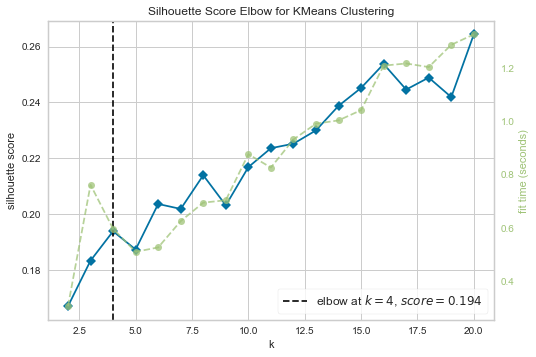

In [7]:
Ysilhouette(df_merged_kmeans_sample)

#### Elbow Method

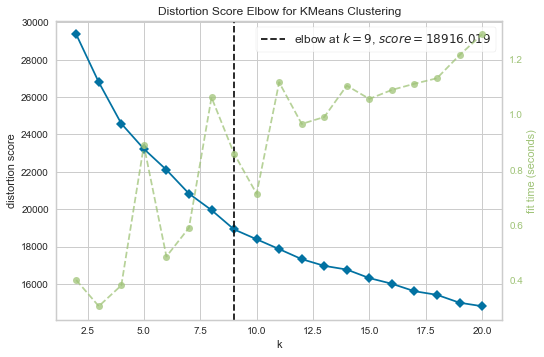

In [8]:
Yelbow(df_merged_kmeans_sample)

#### Davies Bouldin

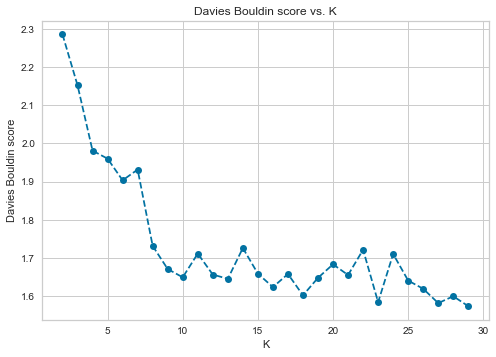

In [9]:
scores = []
centers = list(range(2,30))

for center in centers:
    scores.append(DaviesBouldin(df_merged_kmeans_sample, center))
    
plt.plot(centers, scores, linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('Davies Bouldin score');
plt.title('Davies Bouldin score vs. K');

#### Dendrogram

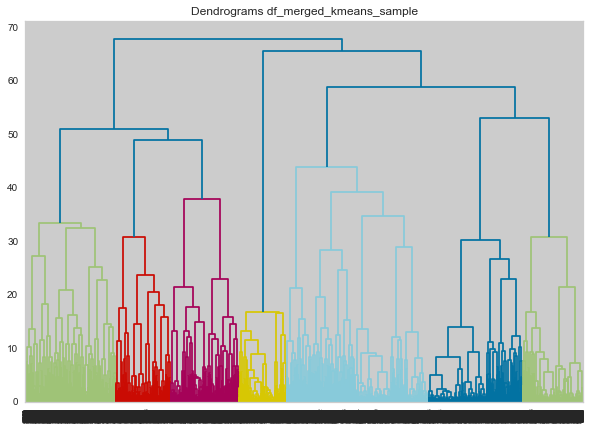

In [10]:
VizDendrogram(df_merged_kmeans_sample)

#### Regarding the selection of the number of clusters, based on the above metrics plots and the heuristic perception of the optimal ammount of clusters, K was set to 11 to group users in order to best adressing sincere results.

### 3) Clusterizing items with full database

In [11]:
# adjusting variable scale
df_kmeans_cluster_full = StandardScaler().fit_transform(df_movies_4kmeans_filtered)

# running Kmeans cosidering 11 centroids
kmeans = KMeans(n_clusters=11, init='k-means++', n_init=100, max_iter=5000, random_state=8).fit(df_kmeans_cluster_full)

# saving complete results with cluster labels to csv
df_movies_4kmeans.insert(0, 'movie_cluster', kmeans.labels_)

# saving clustering results only to csv
df_movies_4kmeans.reset_index(drop=True)
df_movies_4kmeans.to_csv('df_movies_clustered.csv', index=False)


In [12]:
# checking results
df_movies_4kmeans.head(2)

,movie_cluster,movieId,title,voting_count,avg_rate,age_movie_in_2019,age_movie_when_rated,NPS,time_of_day_1,time_of_day_2,...,News,Reality-TV,Romance,Sci-Fi,Short,Sport,Talk-Show,Thriller,War,Western
0,5,1,Toy Story,57309.0,3.893708,24.0,11.041425,4713.0,10574.0,15071.0,...,0,0,0,0,0,0,0,0,0,0
1,5,2,Jumanji,24228.0,3.251527,24.0,10.039830,-10415.0,4749.0,6574.0,...,0,0,0,0,0,0,0,0,0,0


### 4) Generating input database for Fuzzy C-Means 

In [13]:
# importing user wrangled data
df_kmeans_results = df_movies_4kmeans[['movieId','movie_cluster']]
df_user_ratings = pd.read_csv('df_ratings_by_time.csv')
df_user_ratings = df_user_ratings[['userId', 'movieId', 'rating']]

# merging data to create preliminar df_sincere  dataset
df_sincere = df_user_ratings.merge(df_kmeans_results, on='movieId', how='left')
df_sincere.to_csv('df_sincere_database.csv', index=False)

# generate input for fuzzy c-means
df_sincere_grouped = pd.get_dummies(data=df_sincere, columns=['movie_cluster'])
df_sincere_grouped = df_sincere_grouped.drop('movieId', axis=1)
df_sincere_grouped = df_sincere_grouped.groupby('userId').sum().reset_index()
df_fuzzy_cmeans_input = df_sincere_grouped.drop(['userId','rating'], axis=1)

# storing fuzzy c-means input in a csv file 
df_fuzzy_cmeans_input.to_csv('df_users_4clustering.csv', index=False)

# checking results
df_fuzzy_cmeans_input

,movie_cluster_0.0,movie_cluster_1.0,movie_cluster_2.0,movie_cluster_3.0,movie_cluster_4.0,movie_cluster_5.0,movie_cluster_6.0,movie_cluster_7.0,movie_cluster_8.0,movie_cluster_9.0,movie_cluster_10.0
0,13.0,3.0,21.0,8.0,1.0,2.0,6.0,0.0,3.0,6.0,7.0
1,9.0,50.0,47.0,8.0,0.0,21.0,11.0,1.0,9.0,15.0,13.0
2,16.0,247.0,70.0,22.0,2.0,51.0,49.0,22.0,61.0,85.0,31.0
3,1.0,113.0,18.0,1.0,5.0,31.0,31.0,4.0,17.0,16.0,5.0
4,6.0,12.0,18.0,11.0,0.0,10.0,16.0,1.0,4.0,14.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...
162536,10.0,12.0,11.0,10.0,1.0,8.0,14.0,2.0,4.0,6.0,23.0
162537,30.0,18.0,15.0,11.0,0.0,14.0,17.0,2.0,7.0,5.0,35.0
162538,7.0,13.0,10.0,4.0,0.0,2.0,2.0,0.0,4.0,3.0,2.0
162539,8.0,18.0,10.0,3.0,0.0,20.0,2.0,6.0,7.0,4.0,10.0


## C) Clusterizing users using fuzzy c-means

In [14]:
# shortcut | reading from stored intermediate results
#df_fuzzy_cmeans_input = pd.read_csv('df_users_4clustering.csv')

In [15]:
# using standard scaler to normalize data
df_fuzzy_cmeans = StandardScaler().fit_transform(df_fuzzy_cmeans_input)

In [16]:
#finding the best k
for i in range(2,10):
    fuzzycmeans = fuzz.cmeans(df_fuzzy_cmeans.T, c=i, m=1.7, error = 000.5, maxiter=5000, init=None, seed=1)
    cntr, u, u0, d, jm, p, fpc = fuzzycmeans
    print(i,'clusters fpc score:',fpc)

2 clusters fpc score: 0.9501588313559985
3 clusters fpc score: 0.8942739147325446
4 clusters fpc score: 0.843540718262637
5 clusters fpc score: 0.7979355579695129
6 clusters fpc score: 0.7443859372576989
7 clusters fpc score: 0.6986909244905384
8 clusters fpc score: 0.6583497238500552
9 clusters fpc score: 0.6266296960720568


In [17]:
#Fitting the model with k=8
fuzzycmeans = fuzz.cmeans(df_fuzzy_cmeans.T, c=8, m=1.7, error = 000.5, maxiter=5000, init=None, seed=1)
cntr, u, u0, d, jm, p, fpc = fuzzycmeans

# transposing fuzzy into a matrix results
df_cmeans_full = pd.DataFrame(u.T)
df_cmeans_full.head(2)

,0,1,2,3,4,5,6,7
0,0.001320,0.030959,0.005496,0.000087,0.320444,0.000324,0.641360,0.000011
1,0.004319,0.336075,0.027218,0.000198,0.525239,0.000844,0.106085,0.000022


In [18]:
# converting softclustering to hard clustering by labeling users by its user clusrter with higher fuzzy c-means index
cmeanslabels = np.argmax(u,axis=0)

# inserting fuzzy labels on df_cmeans
df_fuzzy_cmeans_output = df_sincere_grouped
df_fuzzy_cmeans_output.insert(0, 'user_cluster', cmeanslabels)
df_fuzzy_cmeans_output.head()

,user_cluster,userId,rating,movie_cluster_0.0,movie_cluster_1.0,movie_cluster_2.0,movie_cluster_3.0,movie_cluster_4.0,movie_cluster_5.0,movie_cluster_6.0,movie_cluster_7.0,movie_cluster_8.0,movie_cluster_9.0,movie_cluster_10.0
0,6,1,267.0,13.0,3.0,21.0,8.0,1.0,2.0,6.0,0.0,3.0,6.0,7.0
1,4,2,668.0,9.0,50.0,47.0,8.0,0.0,21.0,11.0,1.0,9.0,15.0,13.0
2,0,3,2425.5,16.0,247.0,70.0,22.0,2.0,51.0,49.0,22.0,61.0,85.0,31.0
3,1,4,817.5,1.0,113.0,18.0,1.0,5.0,31.0,31.0,4.0,17.0,16.0,5.0
4,4,5,379.0,6.0,12.0,18.0,11.0,0.0,10.0,16.0,1.0,4.0,14.0,9.0


In [19]:
# storing results into csv files
df_fuzzy_cmeans_output.to_csv('df_users_clustered.csv', index=False)
df_cmeans_full.to_csv('df_users_fuzzyCmeans_matrix_results.csv', index=False)

## D) Sincere database

In [20]:
# shortcut | reading from stored intermediate results
#df_sincere = pd.read_csv('df_sincere_database.csv')
#df_fuzzy_cmeans_output = pd.read_csv('df_users_clustered.csv')

# updading sincere database to csv
df_fuzzy_results = df_fuzzy_cmeans_output[['userId', 'user_cluster']]
df_sincere = df_sincere.merge(df_fuzzy_results, on='userId', how='inner').dropna()
df_sincere.to_csv('df_sincere_database.csv', index=False)

# checking results
df_sincere

,userId,movieId,rating,movie_cluster,user_cluster
0,1,296,5.0,9.0,6
1,1,306,3.5,0.0,6
2,1,307,5.0,2.0,6
3,1,665,5.0,3.0,6
4,1,899,3.5,10.0,6
...,...,...,...,...,...
24993911,6597,97660,4.0,9.0,6
24993912,6597,115929,2.5,5.0,6
24993913,6597,117488,3.0,0.0,6
24993914,6597,136580,3.0,8.0,6
